# Data Augmentation by fastai v1

- Author: [Pierre Guillou](https://www.linkedin.com/in/pierreguillou)
- Date: January 2019
- Post in medium: https://medium.com/@pierre_guillou/data-augmentation-par-fastai-v1-e2e69e071ccc
- Ref: [Fastai v1](https://docs.fast.ai/) (Deep Learning library on PyTorch)

In [1]:
# No need to reload the notebook if any change in the fastai library
%reload_ext autoreload
%autoreload 2

# Display images in the notebook
%matplotlib inline

In [2]:
# Import the vision library from fastai 
from fastai.vision import *

In [3]:
import fastai 
print(fastai.__version__)

1.0.42.dev0


In [4]:
# Function that returns an image from its url
def get_img(img_url): return open_image(img_url)

# Function that displays many transformations of an image
def plots_of_one_image(img_url, tfms, rows=1, cols=3, width=15, height=5, **kwargs):
    img = get_img(img_url)
    [img.apply_tfms(tfms, **kwargs).show(ax=ax)
         for i,ax in enumerate(plt.subplots(rows,cols,figsize=(width,height))[1].flatten())]

In [5]:
# Function that displays one image after transformations
def display_img_after_tfms(img_url, tfms, ax, label):
        img = get_img(img_url).apply_tfms(tfms=tfms, size=224)
        img.show(ax=ax)
        ax.set_title(x=0.5,y=-0.1, label=label)

# Cover image

Source: https://www.pariscityvision.com/pt/paris/lugares-marcantes-de-paris/torre-eiffel/historia-torre-eiffel

In [40]:
# path to images folder
path = Config.data_path()/'lieux/'

In [41]:
# get list of images
fnames = get_image_files(path)
img_url = fnames[0]
img_url.name

'te0.jpg'

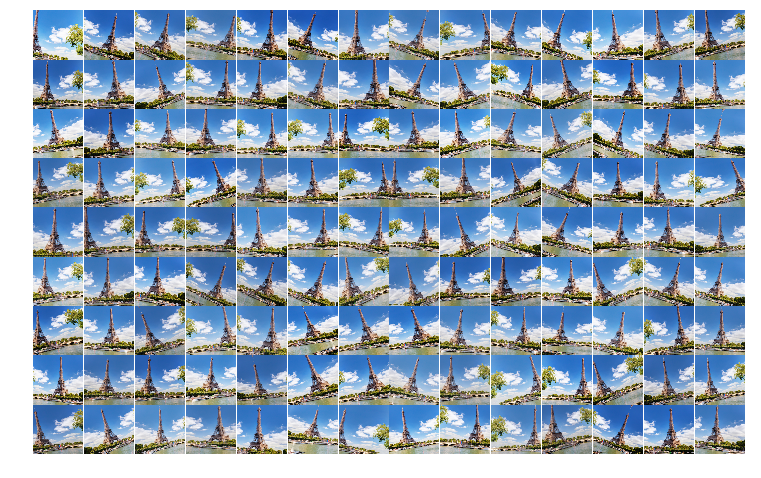

In [836]:
tfms = get_transforms(flip_vert=False,                # flip vertical and horizontal
                      max_rotate=20.0,                # rotation between -30° and 30°
                      max_zoom=1.2)                   # zoom between 1 and 1.2
plots_of_one_image(img_url,tfms[0],9,14,11,7, size=200)
plt.subplots_adjust(left=0, bottom=0,wspace=0, hspace=0)
plt.show()

# Data Augmentation explained

In [839]:
# path to images folder
path = Config.data_path()/'fruits/creations/'

In [840]:
# get list of images
fnames = get_image_files(path)
img_url = fnames[11]
img_url.name

'ligne.png'

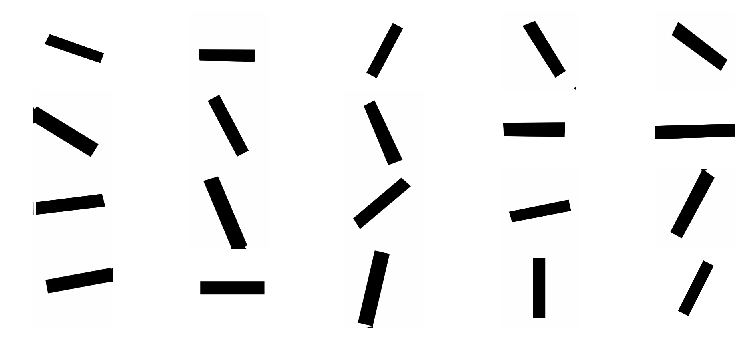

In [829]:
tfms = get_transforms(flip_vert=True,                 # flip vertical and horizontal
                      max_rotate=90.0,                # rotation between -30° and 30°
                      max_zoom=1.4)                   # zoom between 1 and 1.2
plots_of_one_image(img_url,tfms[0],4,5,12,5, size=200)
plt.subplots_adjust(left=0, bottom=0,wspace=0, hspace=0)
plt.show()

# Do not select too much!

In [848]:
# path to images folder
path = Config.data_path()/'fruits/creations/mangues/'

In [849]:
# get list of images
fnames = get_image_files(path)
[f.name for f in fnames]

['IMG_20190113_104041.jpg', 'IMG_20190113_123834.jpg']

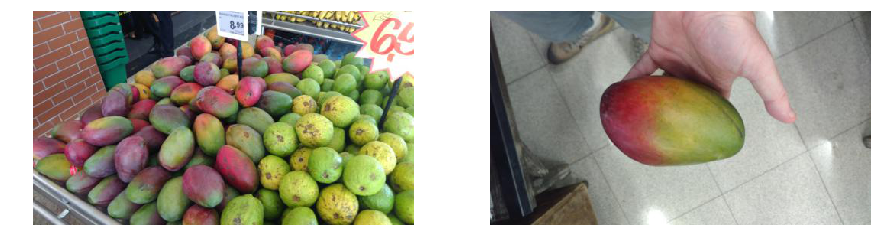

In [632]:
fig, axs = plt.subplots(1,2,figsize=(15,10))
for i, ax in enumerate(axs.flatten()):
    img = get_img(fnames[i])
    img.show(ax=ax)
plt.show()

# Books Classifier by language

In [842]:
# path to images folder
path = Config.data_path()/'books'

In [843]:
# get list of images
fnames = get_image_files(path)
[f.name for f in fnames]

['br.jpg', 'en.jpg', 'fr.jpg']

## Images that help the training

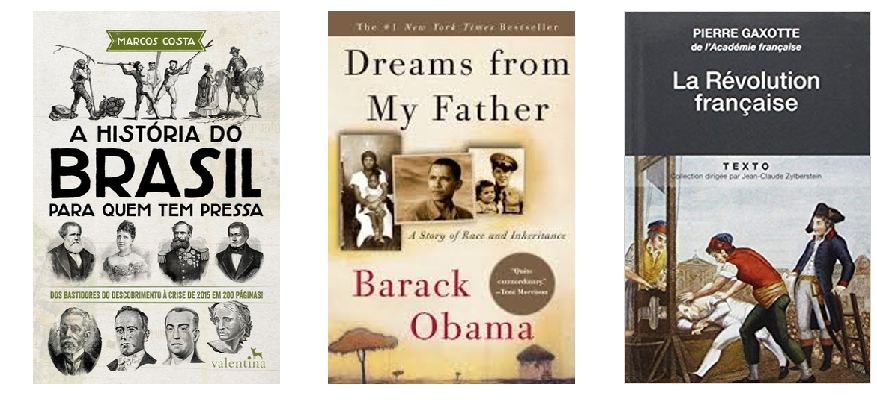

In [453]:
fig, axs = plt.subplots(1,3,figsize=(15,10))
for i, ax in enumerate(axs.flatten()):
    img = get_img(fnames[i])
    img.show(ax=ax)
plt.show()

## Images that DON'T help the training

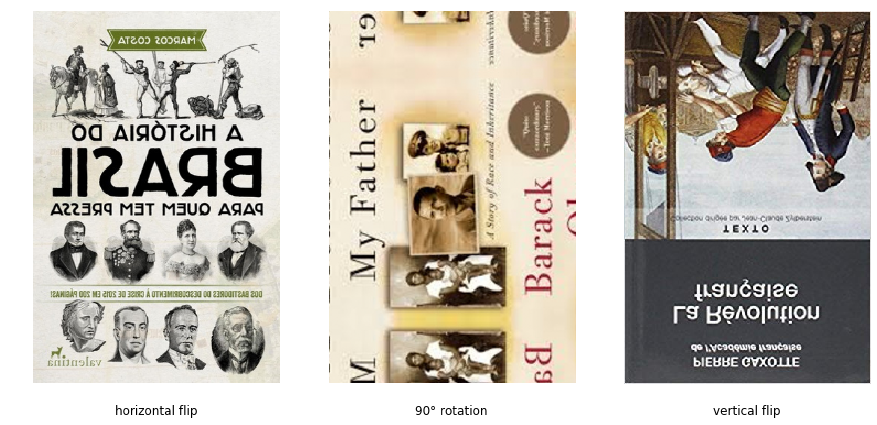

In [455]:
# with horizontal flip (probability = 100%)
tfms1 = [flip_affine(p=1.0)]
# with a 90° rotation (probability = 100%)
tfms2 = [rotate(degrees=90,p=1.0)]

fig, axs = plt.subplots(1,3,figsize=(15,10))
for i, ax in enumerate(axs.flatten()):
    if i == 0: display_img_after_tfms(fnames[i], tfms1, ax, 'horizontal flip')
    elif i == 1: display_img_after_tfms(fnames[i], tfms2, ax, '90° rotation')
    elif i == 2: 
        img = dihedral(get_img(fnames[i]), 3).apply_tfms(tfms=tfms1)
        img.show(ax=ax)
        ax.set_title(x=0.5,y=-0.1, label='vertical flip')
plt.show()

# Fruits Classifier

In [844]:
# path to images folder
path = Config.data_path()/'fruits'

In [845]:
# get list of images
fnames = get_image_files(path)
[f.name for f in fnames]

['1pomme.jpg', 'mangue.jpg', 'orange.jpg']

## Images that help the training

### Without transformation

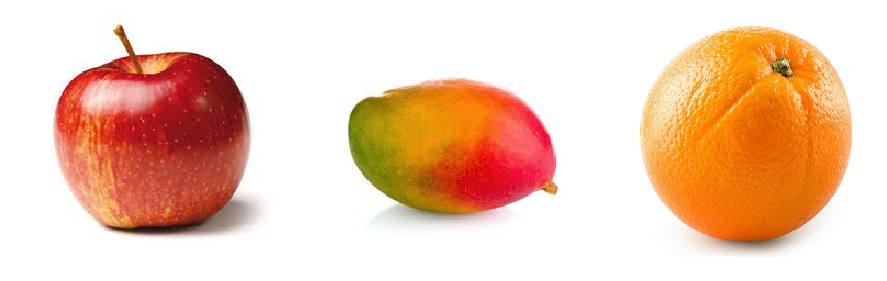

In [463]:
fig, axs = plt.subplots(1,3,figsize=(15,10))
for i, ax in enumerate(axs.flatten()):
    img = get_img(fnames[i])
    img.show(ax=ax)
plt.show()

### With transformations

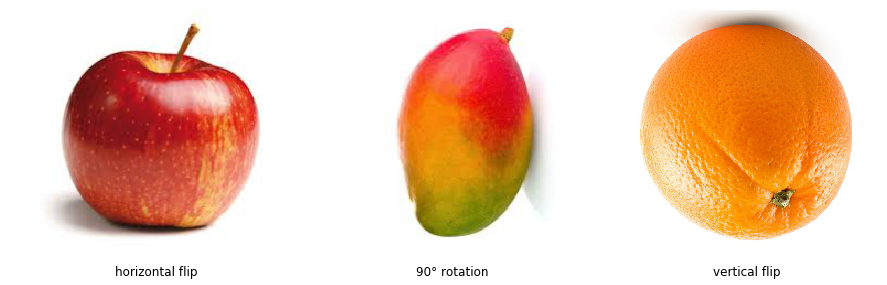

In [465]:
# with horizontal flip (probability = 100%)
tfms1 = [flip_affine(p=1.0)]
# with a 90° rotation (probability = 100%)
tfms2 = [rotate(degrees=90)]

fig, axs = plt.subplots(1,3,figsize=(15,10))
for i, ax in enumerate(axs.flatten()):
    if i == 0: display_img_after_tfms(fnames[i], tfms1, ax, 'horizontal flip')
    elif i == 1: display_img_after_tfms(fnames[i], tfms2, ax, '90° rotation')
    elif i == 2: 
        img = dihedral(get_img(fnames[i]), 3).apply_tfms(tfms=tfms1)
        img.show(ax=ax)
        ax.set_title(x=0.5,y=-0.1, label='vertical flip')
plt.show()

## Example: apply transformations on a mango image

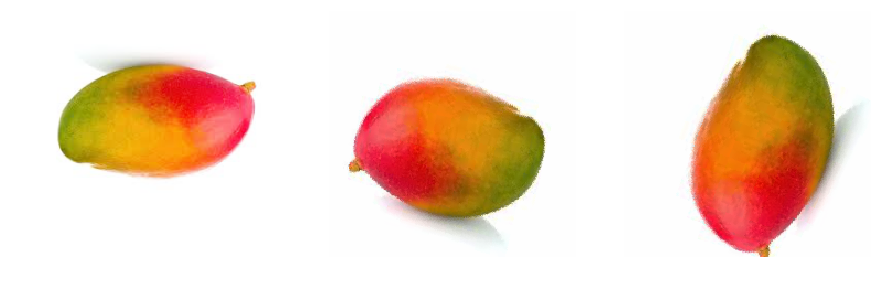

In [579]:
# ADD CUTOUT from https://github.com/fastai/fastai/blob/master/docs_src/vision.transform.ipynb
# tfms = [cutout(n_holes=(1,4), length=(10, 160), p=.5)]
# fig, axs = plt.subplots(1,5,figsize=(12,4))
# for ax in axs:
#     get_ex().apply_tfms(tfms).show(ax=ax)

xtra_tfms = [jitter(magnitude=0.005,p=0.75)]          # random noise with probability 75%
tfms = get_transforms(flip_vert=True,                 # flip vertical and horizontal
                      max_rotate=30.0,                # rotation between -30° and 30°
                      max_zoom=1.2,                   # zoom between 1 and 1.2
                      xtra_tfms=xtra_tfms)

img_url = fnames[1]

plots_of_one_image(img_url,tfms[0], 
                   size=224,             
                   resize_method=ResizeMethod.CROP, 
                   padding_mode='reflection')

# Data Augmentation

## Image without transformation

In [8]:
# path to images folder
path = Config.data_path()/'lieux'

In [11]:
# get list of images
fnames = get_image_files(path)

# get image
# Source: https://www.pariscityvision.com/pt/paris/lugares-marcantes-de-paris/torre-eiffel/historia-torre-eiffel
img_url = fnames[1]
plt.imread(img_url).shape

(566, 847, 3)

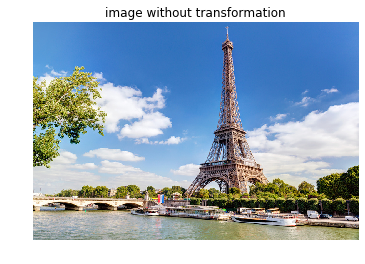

In [12]:
# image WITHOUT transformation
open_image(img_url).show(title='image without transformation', figsize=(8,4))

## Image with transformations by default

### get_transforms()

Source: https://docs.fast.ai/vision.transform.html#get_transforms

In [10]:
# tranformations by default
# return tuple of 2 transformations (train and val)
# the following lines are equal to tfms = get_transforms()

# tfms = get_transforms()

tfms = get_transforms(do_flip=True,
                      flip_vert=False,
                      
                      max_rotate=10.0,
                      max_zoom=1.1,
                      max_warp=0.2,
                      p_affine=0.75,
                      
                      max_lighting=0.2,
                      p_lighting=0.75,
                      
                      xtra_tfms=None
                     )

In [11]:
len(tfms)

2

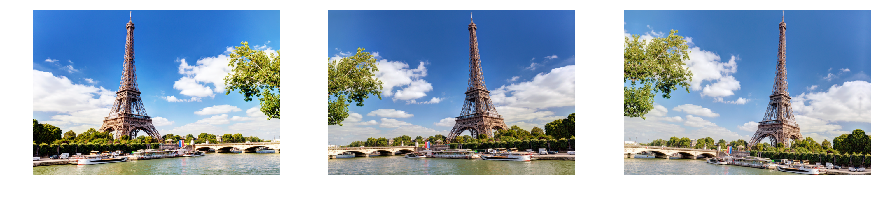

In [644]:
tfms = get_transforms()
plots_of_one_image(img_url,tfms[0])

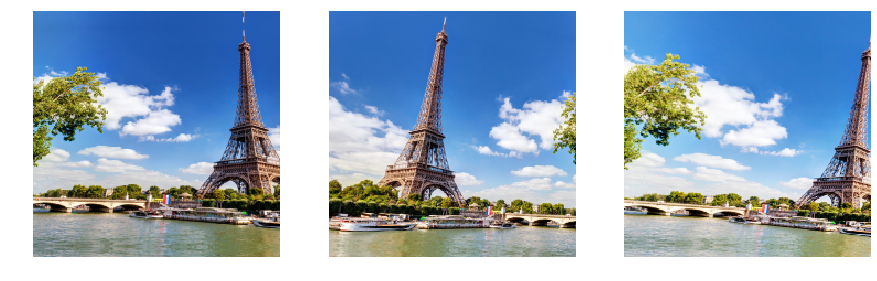

In [643]:
tfms = get_transforms()
plots_of_one_image(img_url,tfms[0],size=224)

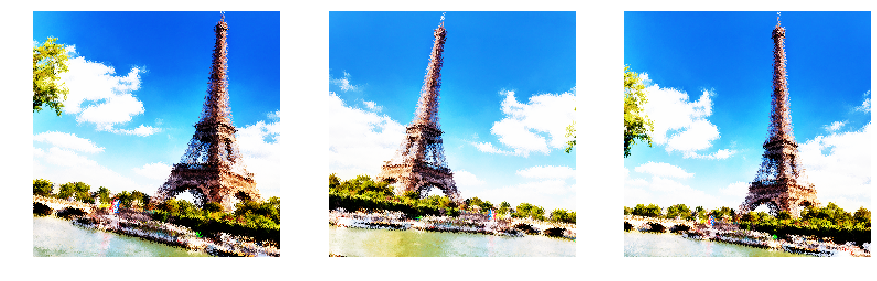

In [290]:
magnitude = 0.01
xtra_tfms = [contrast(scale=(2., 2.), p=1.), jitter(magnitude=magnitude, p=1.)]
tfms = get_transforms(xtra_tfms=xtra_xtfms)

plots_of_one_image(img_url,tfms[0],size=224,resize_method=ResizeMethod.CROP,padding_mode='reflection')

### get_transforms() rewritten

In [856]:
max_rotate = 10.
max_zoom = 1.1
max_warp = 0.2
p_affine = 0.75
max_lighting = 0.2
p_lighting = 0.75

tfms = [rand_crop(),                                             # random crop
            
        flip_affine(p=p_affine),                                 # only horizontal flip 
        #dihedral_affine(p=p_affine),                            # if flip vert, use dihedral_affine
            
        rotate(degrees=(-max_rotate,max_rotate), p=p_affine),    # rotation
        rand_zoom(scale=(1.,max_zoom), p=p_affine),              # random zoom
        symmetric_warp(magnitude=(-0.2,0.2),p=p_affine),         # wrap
            
        brightness(change=(0.5*(1-max_lighting), 0.5*(1+max_lighting)), p=p_lighting),     # brightness
        contrast(scale=(1-max_lighting, 1/(1-max_lighting)), p=p_lighting)                 # contrast
        ]

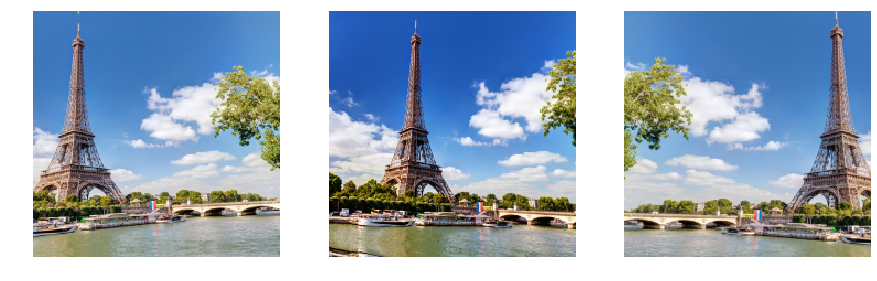

In [292]:
plots_of_one_image(img_url,tfms,size=224,resize_method=ResizeMethod.CROP,padding_mode='reflection')

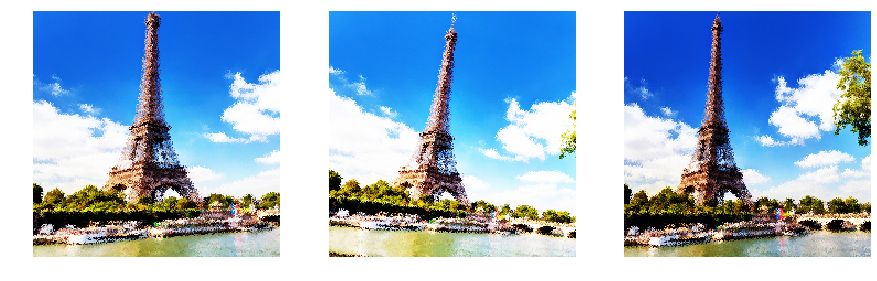

In [306]:
magnitude = 0.01
xtra_tfms = [contrast(scale=(2., 2.), p=1.), jitter(magnitude=magnitude, p=1.)] 
tfms = tfms + xtra_tfms

plots_of_one_image(img_url,tfms,size=224,resize_method=ResizeMethod.CROP,padding_mode='reflection')

## apply_tfms(tfms, size, **kwargs)

Source: https://docs.fast.ai/vision.image.html#Image.apply_tfms

In [ ]:
# values by default of apply_tfms()
apply_tfms(tfms=tfms,
           do_resolve=True,
           xtra=None,
           size=None,
           resize_method='',
           mult=32,
           padding_mode='reflection', 
           mode='bilinear',
           remove_out=True)

### size | Change the size

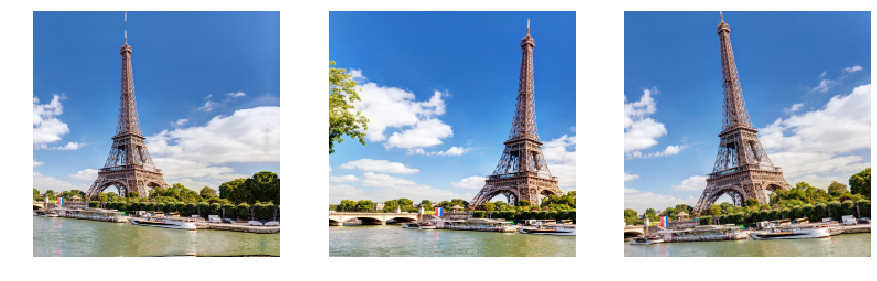

In [43]:
# get image with identical squared size
# It will ensure all the images are cropped or padded to the same size so we can then collate them into batches.
tfms = get_transforms()
plots_of_one_image(img_url,tfms[0],size=224)

### padding_mode | Fill in missing pixels (after a rotation for example)

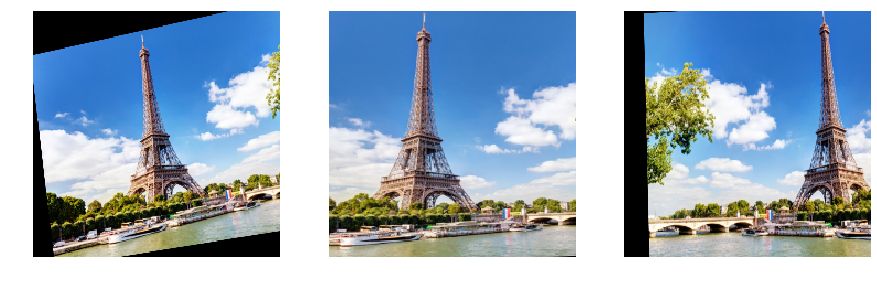

In [679]:
# We can set missing pixels after a rotation for example
# padding_mode= 'zeros', 'border' or 'reflection'
# padding_mode='reflection is the default
tfms = get_transforms()
plots_of_one_image(img_url,tfms[0],size=224,padding_mode='zeros')

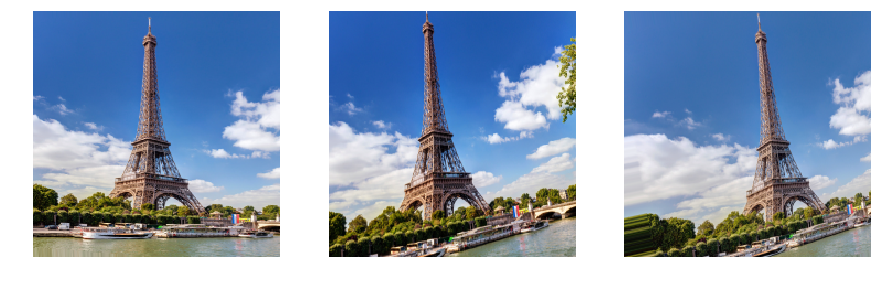

In [287]:
# We can set missing pixels after a rotation for example
# padding_mode= 'zeros', 'border' or 'reflection'
# padding_mode='reflection is the default
tfms = get_transforms()
plots_of_one_image(img_url,tfms[0],size=224,padding_mode='border')

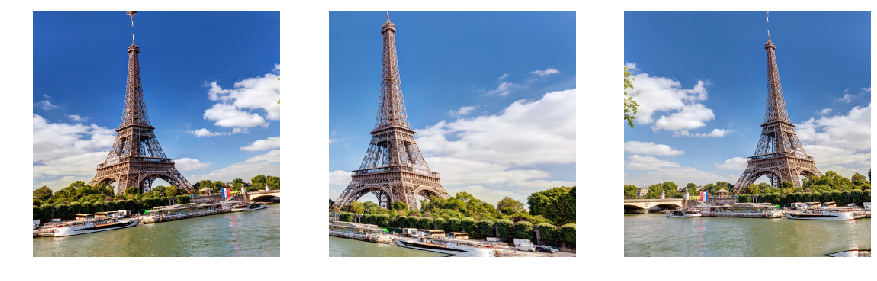

In [310]:
# We can set missing pixels after a rotation for example
# padding_mode= 'zeros', 'border' or 'reflection'
# padding_mode='reflection is the default
tfms = get_transforms()
plots_of_one_image(img_url,tfms[0],size=224,padding_mode='reflection')

### resize_method

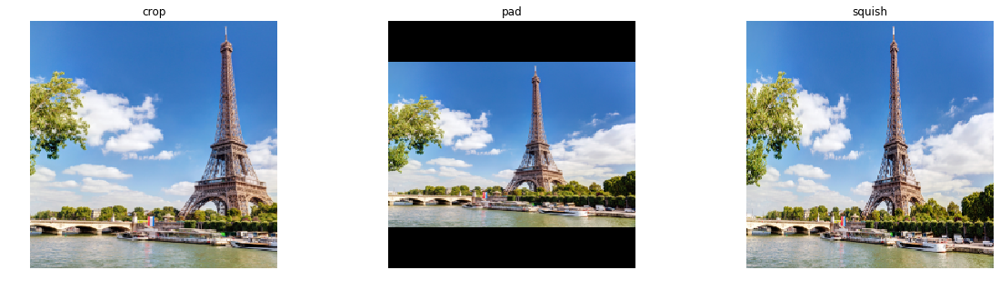

In [48]:
#tfms = get_transforms()
_,axs = plt.subplots(1,3,figsize=(20,5))
for rsz,ax in zip([ResizeMethod.CROP, ResizeMethod.PAD, ResizeMethod.SQUISH], axs):
    get_img(img_url).apply_tfms([rand_crop()], resize_method=rsz, size=224, padding_mode='zeros').show(ax=ax, title=rsz.name.lower())

## List of transforms

Source: https://docs.fast.ai/vision.transform.html#List-of-transforms

### Rotate

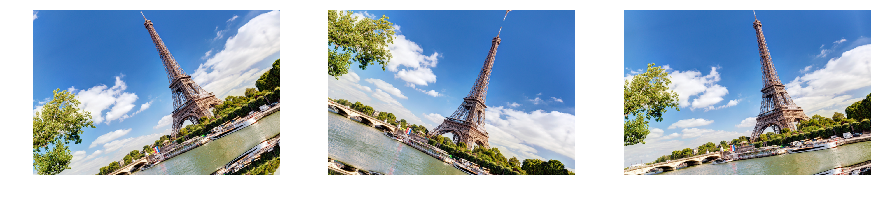

In [885]:
tfms = [rotate(degrees=(-30,30), p=1.0)]
plots_of_one_image(img_url,tfms)

# If you want random squared images, run the following code
# tfms = [rotate(degrees=(-30,30), p=1.0)]
# plots_of_one_image(img_url,tfms,size=224)

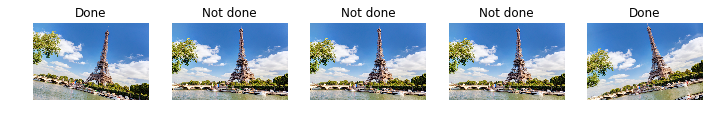

In [871]:
tfms = [rotate(degrees=(-30,30), p=0.75)]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    img = get_img(img_url).apply_tfms(tfms)
    title = 'Done' if tfms[0].do_run else 'Not done'
    img.show(ax=ax, title=title)

### Brightness

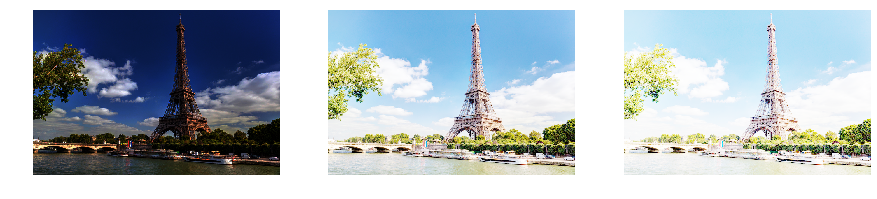

In [901]:
tfms = [brightness(change=(0.1, 0.9), p=1.0)]
plots_of_one_image(img_url,tfms)

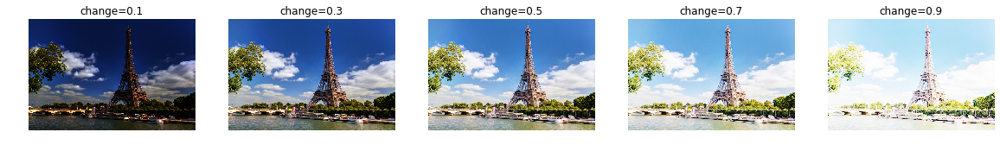

In [695]:
fig, axs = plt.subplots(1,5,figsize=(20,5))
for change, ax in zip(np.linspace(0.1,0.9,5), axs):
    tfms = [brightness(change=change, p=1.)]
    get_img(img_url).apply_tfms(tfms).show(ax=ax, title=f'change={change:.1f}')

### Contrast

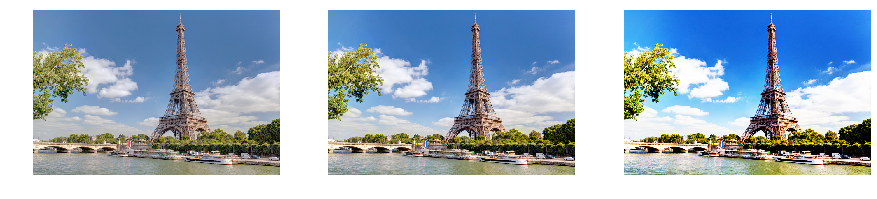

In [903]:
tfms = [contrast(scale=(0.5, 2.), p=1.)]
plots_of_one_image(img_url,tfms)

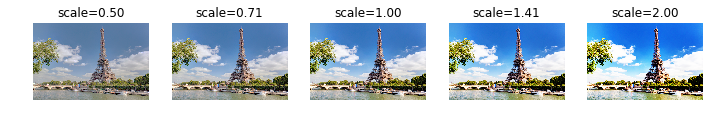

In [95]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for scale, ax in zip(np.exp(np.linspace(log(0.5),log(2),5)), axs):
    contrast(get_img(img_url), scale).show(ax=ax, title=f'scale={scale:.2f}')

### jitter

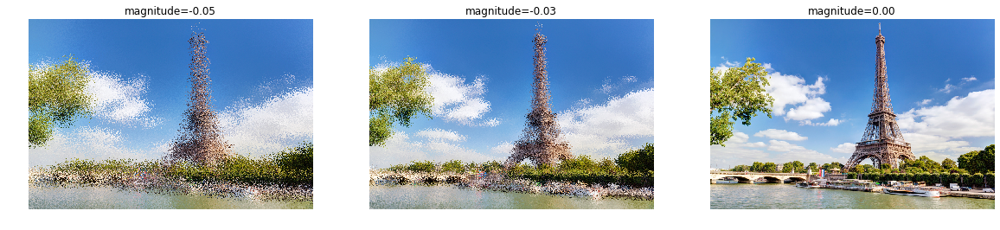

In [909]:
fig, axs = plt.subplots(1,3,figsize=(20,5))
for magnitude, ax in zip(np.linspace(-0.05,0.05,5), axs):
    tfms = [jitter(magnitude=magnitude, p=1.)]
    get_img(img_url).apply_tfms(tfms).show(ax=ax, title=f'magnitude={magnitude:.2f}')

### symmetric_warp

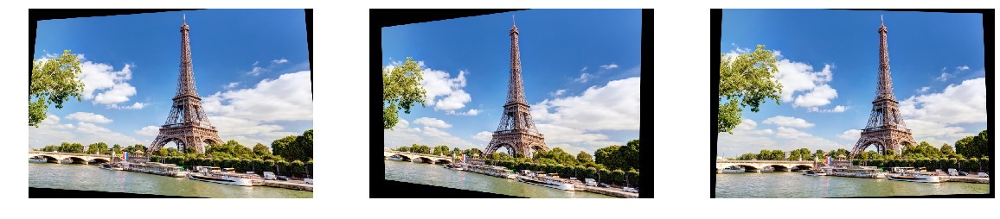

In [913]:
tfms = [symmetric_warp(magnitude=(-0.2,0.2), p=1.)]
plots_of_one_image(img_url,tfms,padding_mode='zeros')

### zoom

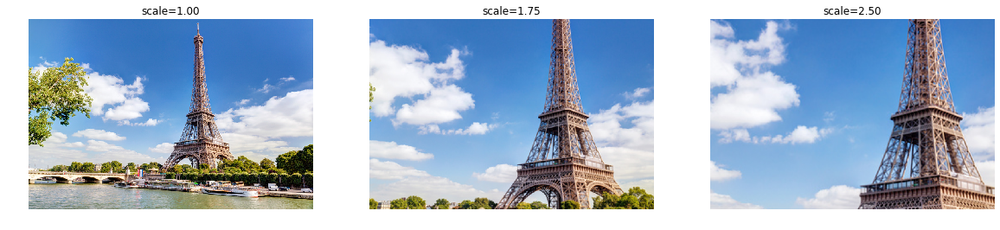

In [935]:
fig, axs = plt.subplots(1,3,figsize=(20,5))
for scale, ax in zip(np.linspace(1.,2.5,3), axs):
    tfms = [zoom(scale=scale, p=1.)]
    get_img(img_url).apply_tfms(tfms).show(ax=ax, title=f'scale={scale:.2f}')

### cutout

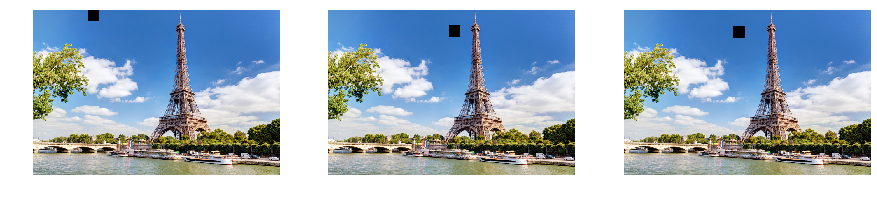

In [13]:
tfms = [cutout()]
plots_of_one_image(img_url,tfms)

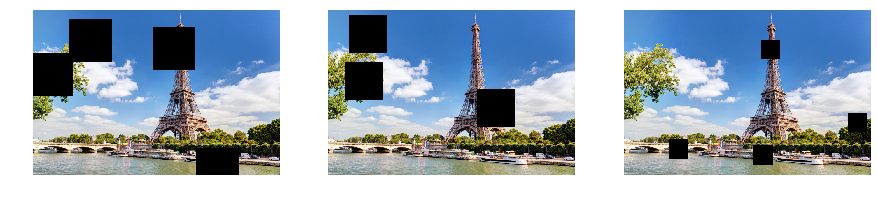

In [19]:
tfms = [cutout(n_holes=(1,4), length=(10, 160), p=1.)]
plots_of_one_image(img_url,tfms)

## Convenience functions

### crop_pad()

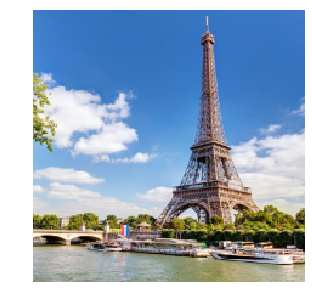

In [75]:
tfms = [crop_pad()]
new_img = get_img(img_url).apply_tfms(tfms, size=224)
new_img_name = 'new_' + img_url.name
path_new = path / str(new_img_name)
new_img.save(path_new)
new_img.show(figsize=(15,5))

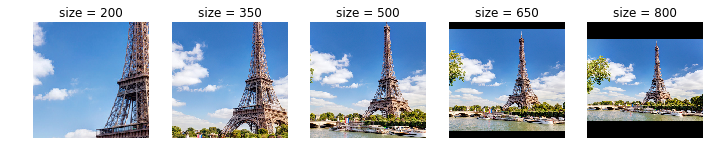

In [61]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for size, ax in zip(np.linspace(200,800,5), axs):
    crop_pad(get_img(img_url), int(size), 'zeros', 0.5,0.5).show(ax=ax, title=f'size = {int(size)}')

### rand_crop()

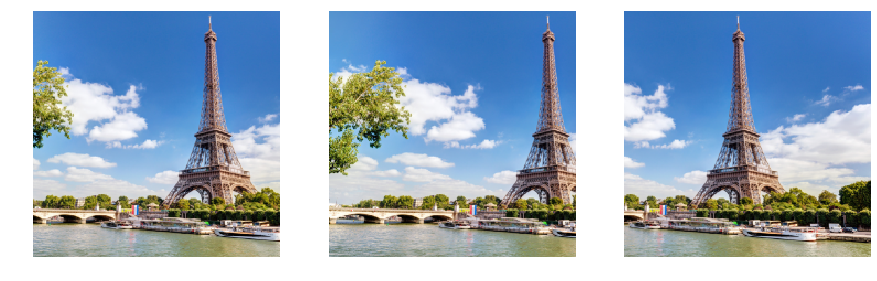

In [959]:
tfms = [rand_crop(p=1.)]
plots_of_one_image(img_url,tfms,size=224)

### rand_zoom()

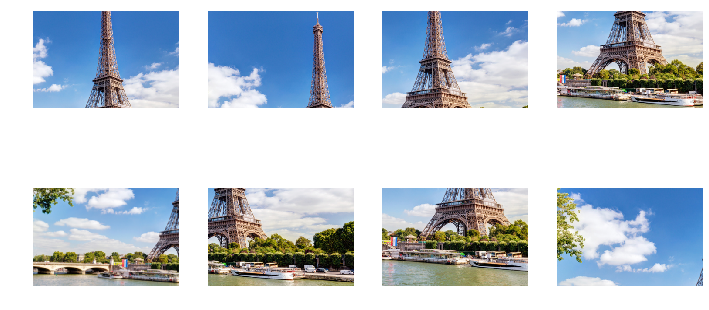

In [116]:
tfms = [rand_zoom(scale=(2.,2.5))]
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_img(img_url).apply_tfms(tfms, size=224)
    img.show(ax=ax)

### rand_crop() + rand_zoom()

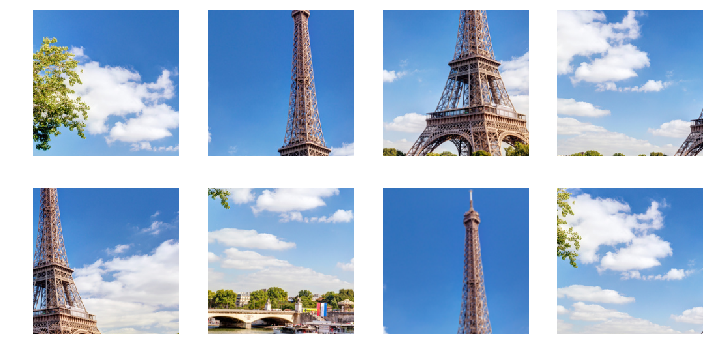

In [117]:
tfms = [rand_crop(),rand_zoom(scale=(2.,2.5))]
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_img(img_url).apply_tfms(tfms, size=224)
    img.show(ax=ax)

# (ImageDataBunch) DA for Deep Learning

Source: https://docs.fast.ai/vision.data.html#ImageDataBunch

In [5]:
# path to images folder
path = Config.data_path()/'lieux/'

In [6]:
# Create ImageDataBunch with transformations
tfms = get_transforms()             
data = ImageDataBunch.from_folder(path, ds_tfms=tfms, size=224, bs=4)

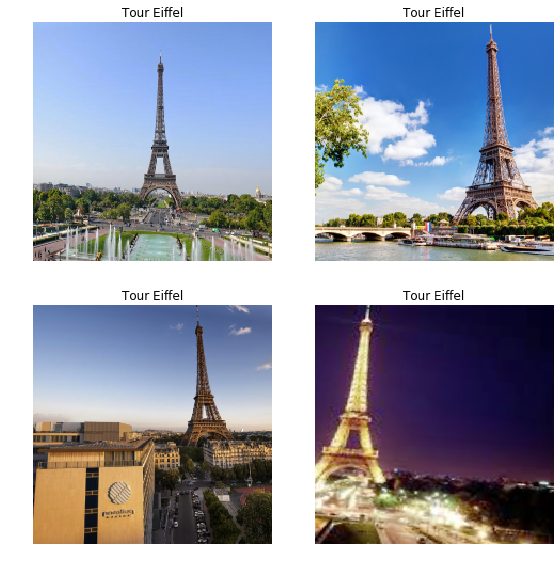

In [8]:
# Show train batch
data.show_batch(2)

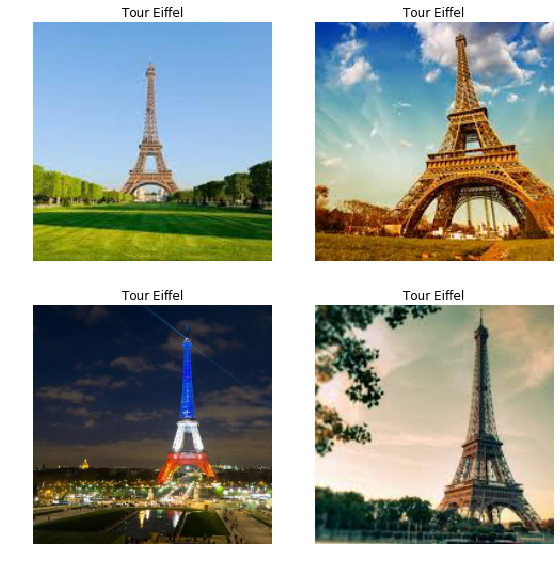

In [9]:
# Show validation batch
data.show_batch(2,ds_type=DatasetType.Valid)